# Segmentation with CellPose

In this notebook you'll find nuclei segmentation method with CellPose applied to PDAC dataset.

We tested the tool on normalized and non-normalized H&E images.

- Cellpose tutorial (on squipdy) : https://squidpy.readthedocs.io/en/stable/external_tutorials/tutorial_cellpose_segmentation.html

The save function for the masks was found here : https://github.com/theislab/squidpy_reproducibility/blob/master/notebooks/image_figures/feature_extraction_workflow.ipynb

*DO NOT USE THIS COMMANDE* "squidpy.im.ImageContainer.save" (delete workspace)

# 0. Preliminary steps

## 0.1. Import packages

conda env create -f env_cellpose.yml 

conda activate cellpose

pip install ipykernel

python -m ipykernel install --user --name=cellpose --display-name=Cellpose

pip install imagecodecs

pip install opencv-python

In [1]:
import os
import squidpy as sq
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from cellpose import models

## 0.2. Set pathways for outputs

In [2]:
path_images = "./input_images/wo_background_normalized" 

In [14]:
## Result folder 
output_path = f"/sbgenomics/output-files/data/segmentation_cellpose_wo_background_normalized"
os.makedirs(output_path, exist_ok=True)

In [17]:
path = f"./masks_segmentation"

In [9]:
save_imCont = f"./image_container/"

## 0.3. Fonctions definition

In [2]:
def cellpose_he(img, min_size=15, flow_threshold=0.4, channel_cellpose=0):
    """Run cellpose and get masks

    Parameters
    ----------
    img : array of image
    min_size : int
         minimum number of pixels per mask
    flow_threshold : float
        flow error threshold
    channel_cellpose : list
        list of channels

    Returns
    -------
    res : list of array
        mask labels
    """
    model = models.Cellpose(model_type='nuclei')
    res, _, _, _ = model.eval(
        img,
        channels=[channel_cellpose, 0],
        diameter=None,
        min_size=min_size,
        invert=True,
        flow_threshold=flow_threshold,
    )
    return res

In [11]:
def plot_results_segmentation(segmented_img):
    """Plot segmentation results
    
    Parameters
    ----------
    segmented_img : array of image
    """
    # Print the container
    print(segmented_img)

    # Print the numbre of segments
    print(f"Number of segments in crop: {len(np.unique(segmented_img['segmented_custom']))}")

    # Plot the original input image VS the mask
    fig, axes = plt.subplots(1, 2, figsize=(10, 20))
    segmented_img.show("image", channel=None, ax=axes[0])
    _ = axes[0].set_title("H&E")
    segmented_img.show("segmented_custom", cmap="jet", interpolation="none", ax=axes[1])
    _ = axes[1].set_title("Cellpose segmentation")

# Normalized without background

In [4]:
image_name = "PDAC_B2_result_wo_background_normalized"

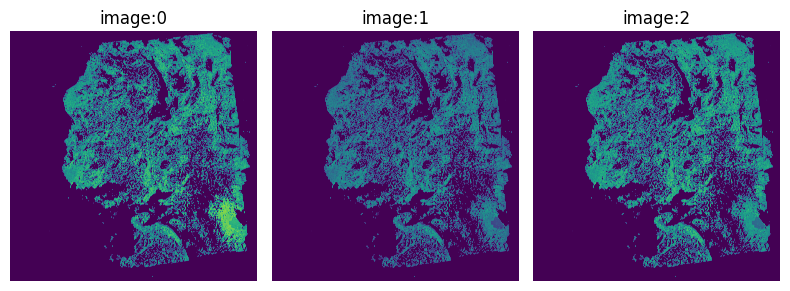

In [7]:
# Load image into an ImageContainer
norm_wo_background_PDAC_B2 = sq.im.ImageContainer("./input_images/wo_background_normalized/PDAC_B2_result_wo_background_normalized.jpg")

# Show the image in 3 channels with color inverted
norm_wo_background_PDAC_B2.show("image", channelwise=True)

In [8]:
# Run segmentation with CellPose method
sq.im.segment(img=norm_wo_background_PDAC_B2, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8)

In [11]:
norm_wo_background_PDAC_B2.save(f"{save_imCont}/PDAC_B2_result_wo_background_normalized_container_wo_chunk")

Run at 2:42pm finish at 5:30pm

ImageContainer[shape=(17107, 16907), layers=['image', 'segmented_custom']]
Number of segments in crop: 51656


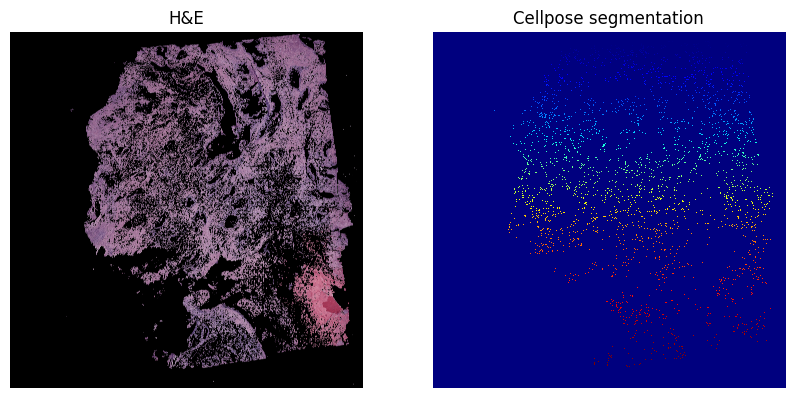

In [12]:
# Print the container
print(norm_wo_background_PDAC_B2)

# Print the numbre of segments
print(f"Number of segments in crop: {len(np.unique(norm_wo_background_PDAC_B2['segmented_custom']))}")

# Plot the original input image VS the mask
fig, axes = plt.subplots(1, 2, figsize=(10, 20))
norm_wo_background_PDAC_B2.show("image", channel=None, ax=axes[0])
_ = axes[0].set_title("H&E")
norm_wo_background_PDAC_B2.show("segmented_custom", cmap="jet", interpolation="none", ax=axes[1])
_ = axes[1].set_title("Cellpose segmentation")

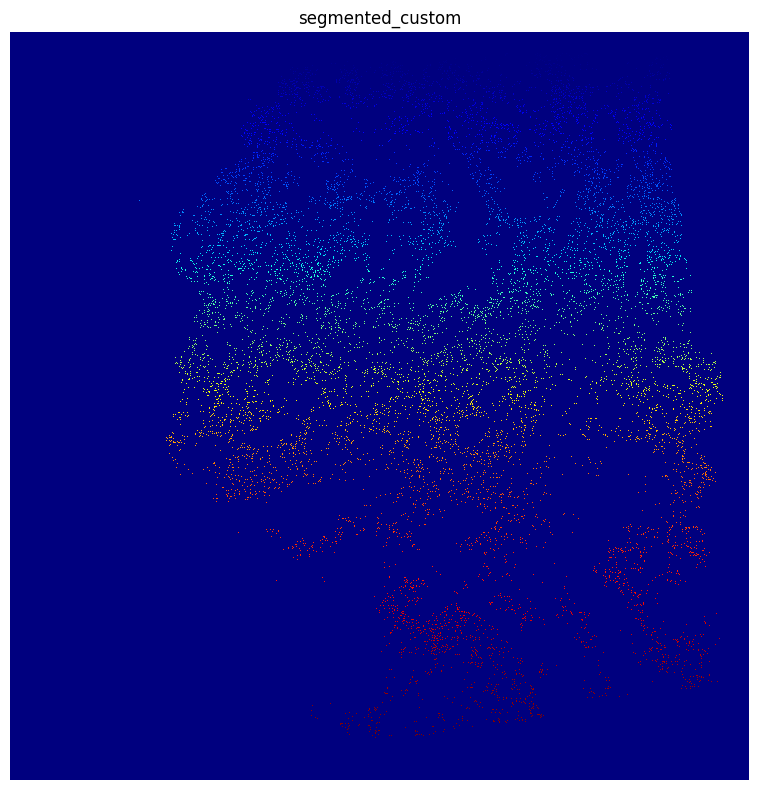

In [15]:
# Show the mask and save it in the output of seven bridges
norm_wo_background_PDAC_B2.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/PDAC_B2_result_wo_background_normalized_container_wo_chunk_mask")

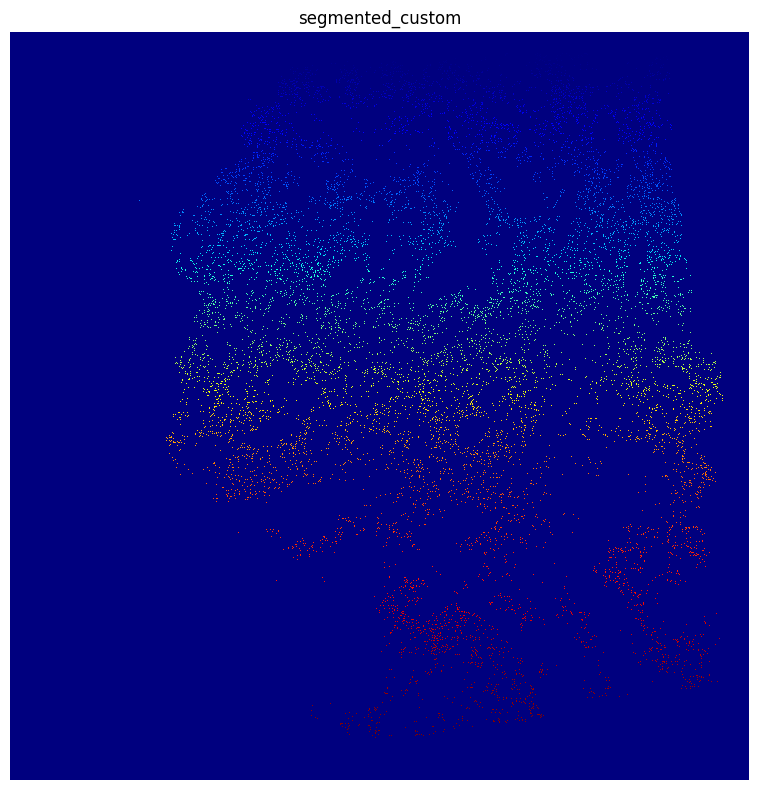

In [18]:
# Show the mask and save it in the output of the workspace
norm_wo_background_PDAC_B2.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/PDAC_B2_result_wo_background_normalized_container_wo_chunk_mask")

In [ ]:
# Show the mask on the original input
norm_wo_background_PDAC_B2.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

## 1.1. PDAC

### 1.1.1. PDAC_ILS50185PT2_B2

In [61]:
image_name = "PDAC_ILS50185PT2_B2"

In [ ]:
# Load image into an ImageContainer
norm_PDAC_B2 = sq.im.ImageContainer("normalized_images_hne/PDAC_ILS50185PT2_B2/PDAC_ILS50185PT2_B2_normalized.jpg")

# Show the image in 3 channels with color inverted
norm_PDAC_B2.show("image", channelwise=True)

In [12]:
# Run segmentation with CellPose method
sq.im.segment(img=norm_PDAC_B2, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8)

In [ ]:
# Run segmentation with CellPose method
sq.im.segment(img=norm_PDAC_B2, layer="image", channel=None, method=cellpose_he_chunk, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [ ]:
norm_PDAC_B2.save(f"{save_imCont}/norm_PDAC_B2_imCont_chunk_10000")

In [23]:
# test to laod the container
test_zarr = sq.im.ImageContainer.load('norm_PDAC_B2_imcontainer')
test_zarr

ImageContainer[shape=(17107, 16907), layers=['image', 'segmented_custom']]

ImageContainer[shape=(17107, 16907), layers=['image', 'segmented_custom']]
Number of segments in crop: 52278


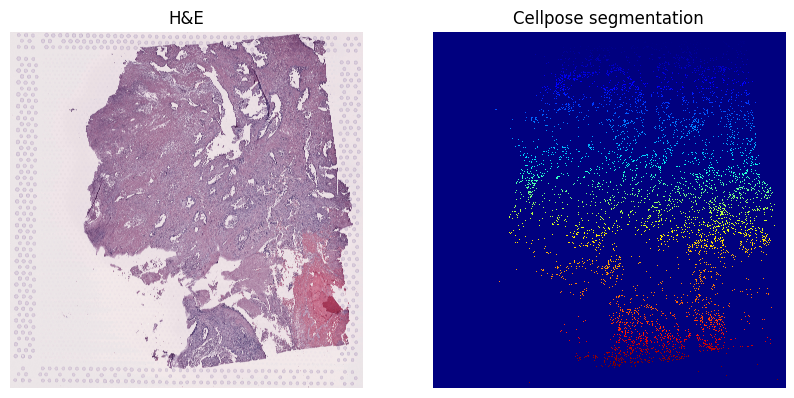

In [41]:
# Print the container
print(norm_PDAC_B2)

# Print the numbre of segments
print(f"Number of segments in crop: {len(np.unique(norm_PDAC_B2['segmented_custom']))}")

# Plot the original input image VS the mask
fig, axes = plt.subplots(1, 2, figsize=(10, 20))
norm_PDAC_B2.show("image", channel=None, ax=axes[0])
_ = axes[0].set_title("H&E")
norm_PDAC_B2.show("segmented_custom", cmap="jet", interpolation="none", ax=axes[1])
_ = axes[1].set_title("Cellpose segmentation")

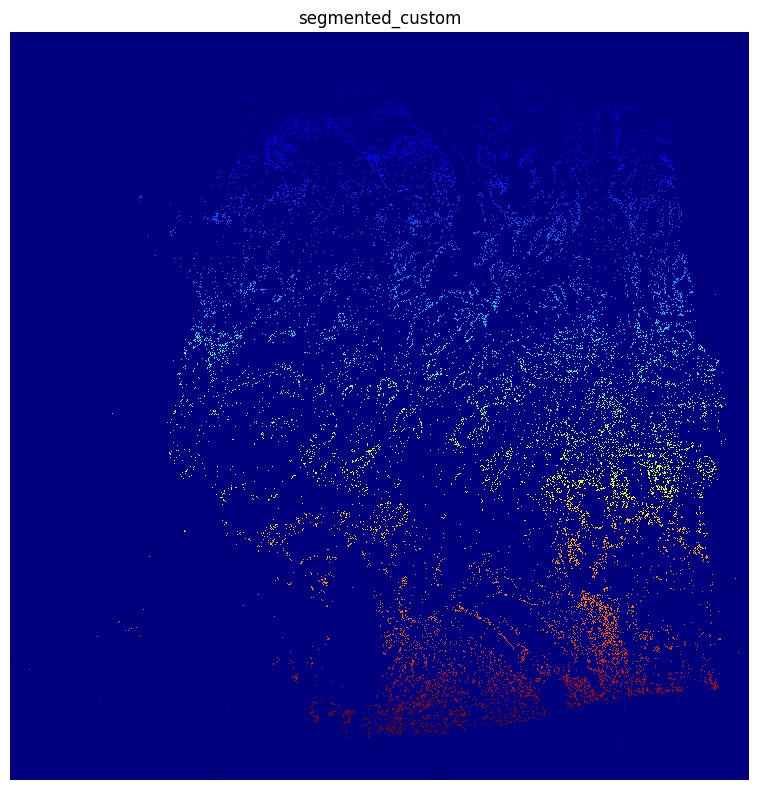

In [42]:
# Show the mask and save it in the output of seven bridges
norm_PDAC_B2.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/norma_whole_{image_name}_mask")

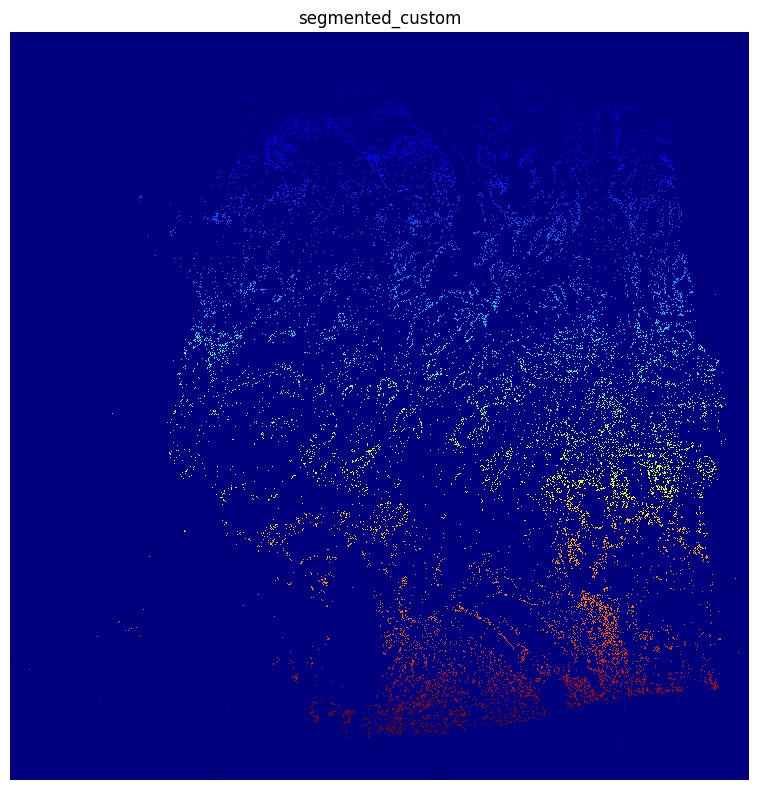

In [43]:
# Show the mask and save it in the output of the workspace
norm_PDAC_B2.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/norma_whole_{image_name}_mask")

Informations about interpolation : https://matplotlib.org/stable/gallery/images_contours_and_fields/interpolation_methods.html 

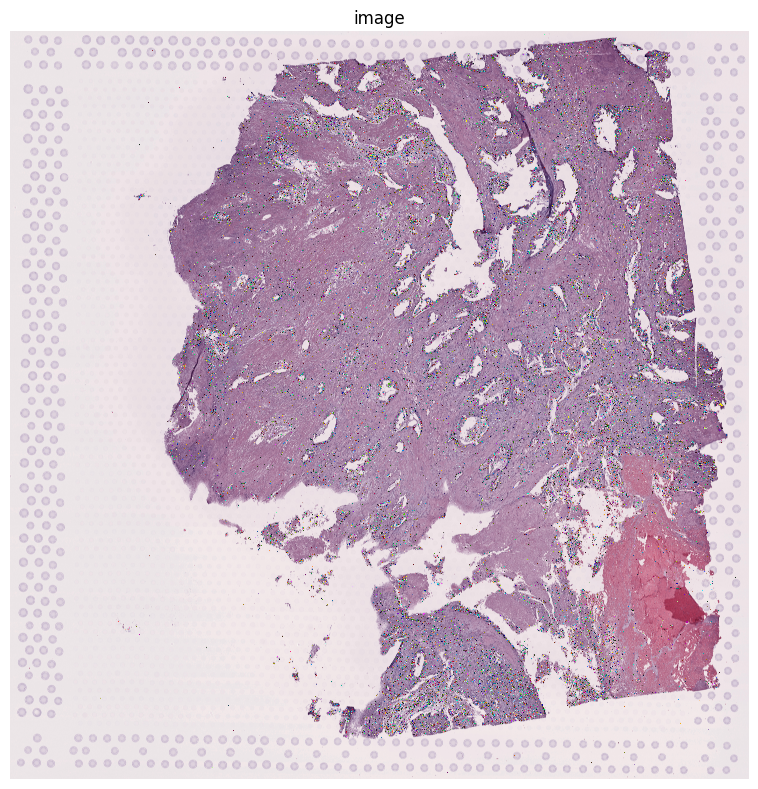

In [44]:
# Show the mask on the original input
norm_PDAC_B2.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

### 1.1.2. PDAC_12747476B_A1

In [12]:
image_name = "PDAC_12747476B_A1"

In [13]:
# Load image into an ImageContainer
PDAC_A1 = sq.im.ImageContainer("normalized_images_hne/PDAC_12747476B_A1/PDAC_12747476B_A1_normalized.jpg")

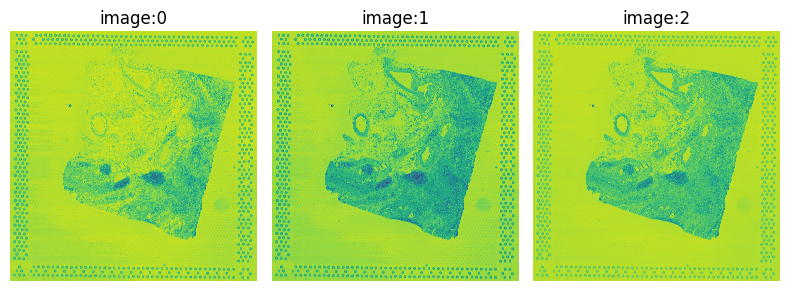

In [70]:
# Show the image in 3 channels with color inverted
PDAC_A1.show("image", channelwise=True)

In [14]:
# Run segmentation with CellPose method
sq.im.segment(img=PDAC_A1, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [15]:
PDAC_A1.save(f"{save_imCont}/norm_PDAC_A_imCont_chunk_10000")

ImageContainer[shape=(17242, 17043), layers=['image', 'segmented_custom']]
Number of segments in crop: 61861


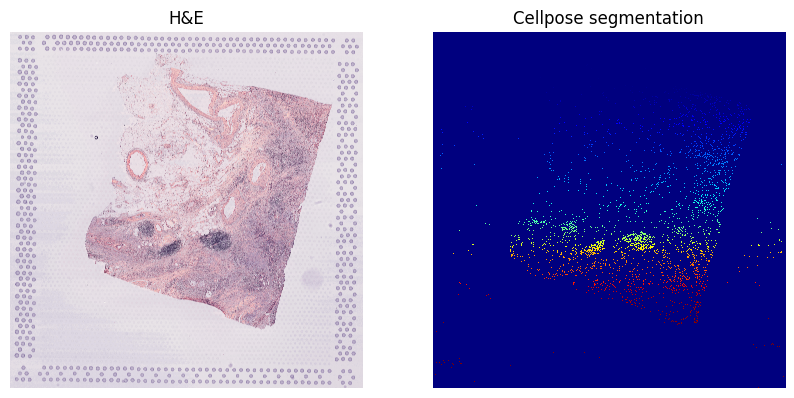

In [15]:
plot_results_segmentation(PDAC_A1)

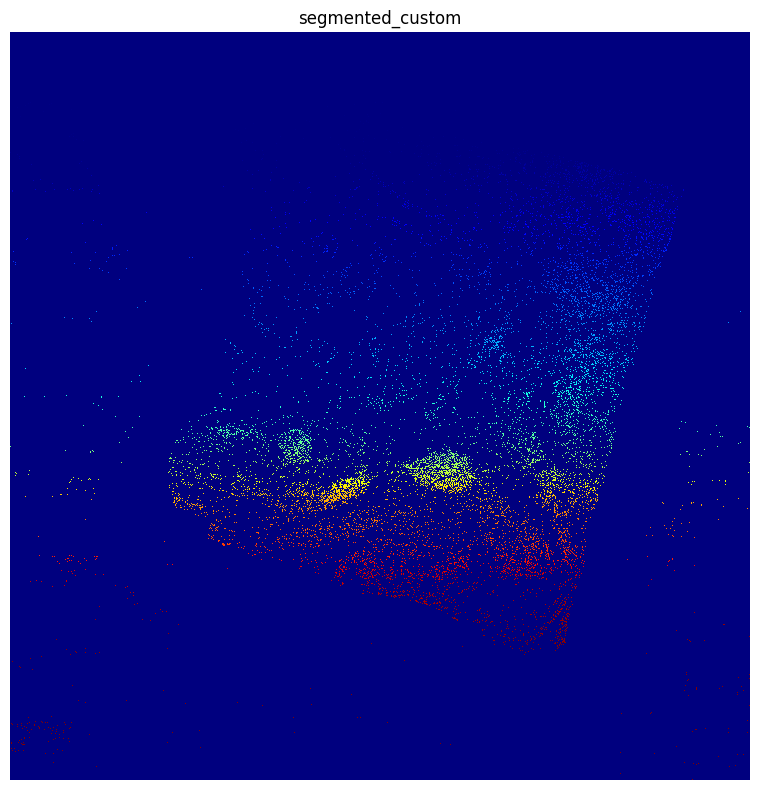

In [16]:
# Show the mask and save it in the output of seven bridges
PDAC_A1.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/norma_whole_{image_name}_mask")

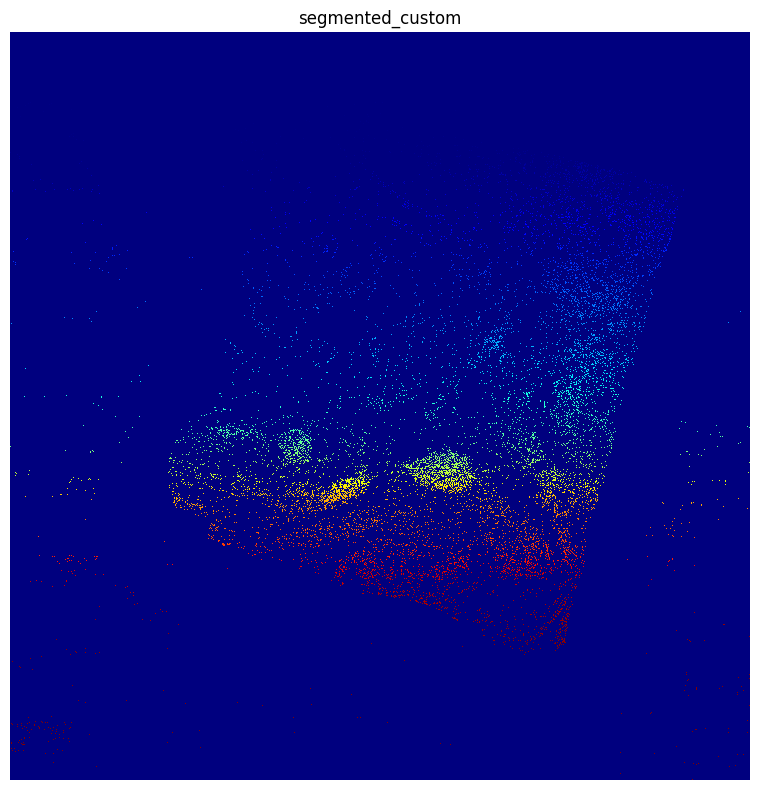

In [17]:
# Show the mask and save it in the output of the workspace
PDAC_A1.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/norma_whole_{image_name}_mask")

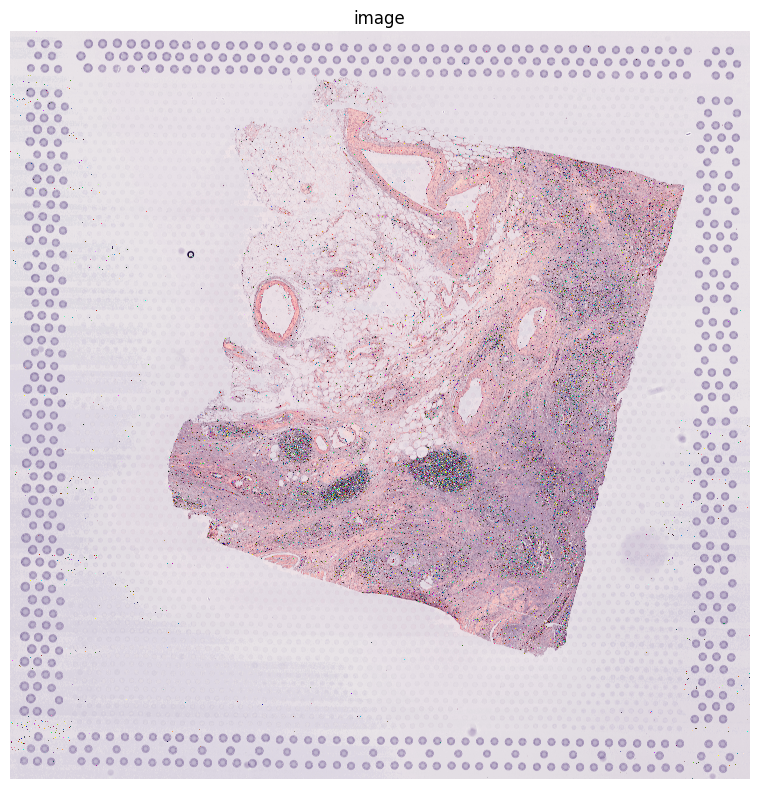

In [18]:
# Show the mask on the original input
PDAC_A1.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

## 1.2. PanCN

### 1.2.1. PanCN_AVD_61VQ_0158

In [36]:
image_name = "PanCN_AVD_61VQ_0158"

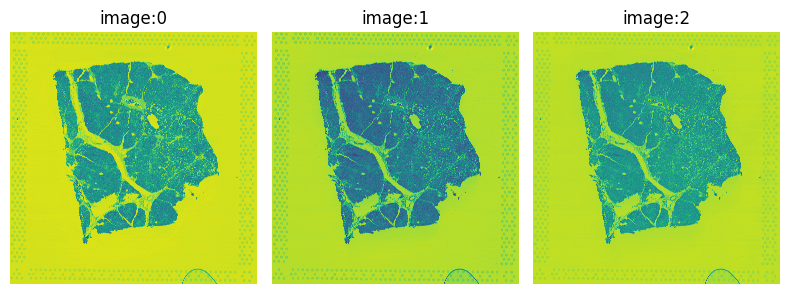

In [37]:
# Load image into an ImageContainer
PanCN_D4 = sq.im.ImageContainer("normalized_images_hne/PanCN_AVD_61VQ_0158/PanCN_AVD_61VQ_0158_normalized.jpg")

# Show the image in 3 channels with color inverted
PanCN_D4.show("image", channelwise=True)

In [39]:
# Run segmentation with CellPose method
sq.im.segment(img=PanCN_D4, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [40]:
PanCN_D4.save(f"{save_imCont}/norm_PanCN_D4_imCont_chunk_10000")

ImageContainer[shape=(17137, 16768), layers=['image', 'segmented_custom']]
Number of segments in crop: 36355


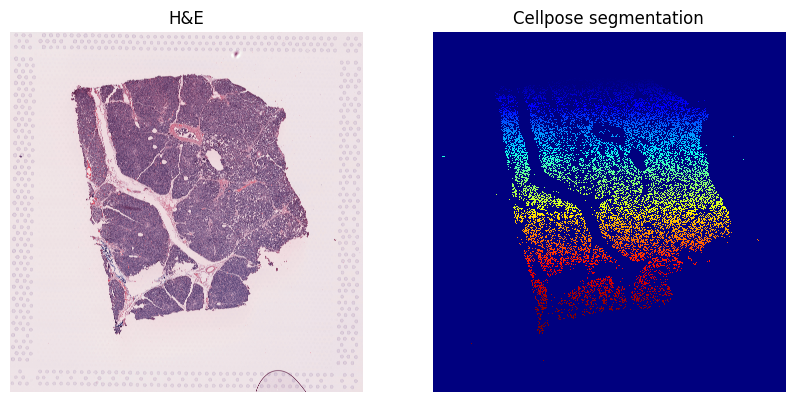

In [22]:
plot_results_segmentation(PanCN_D4)

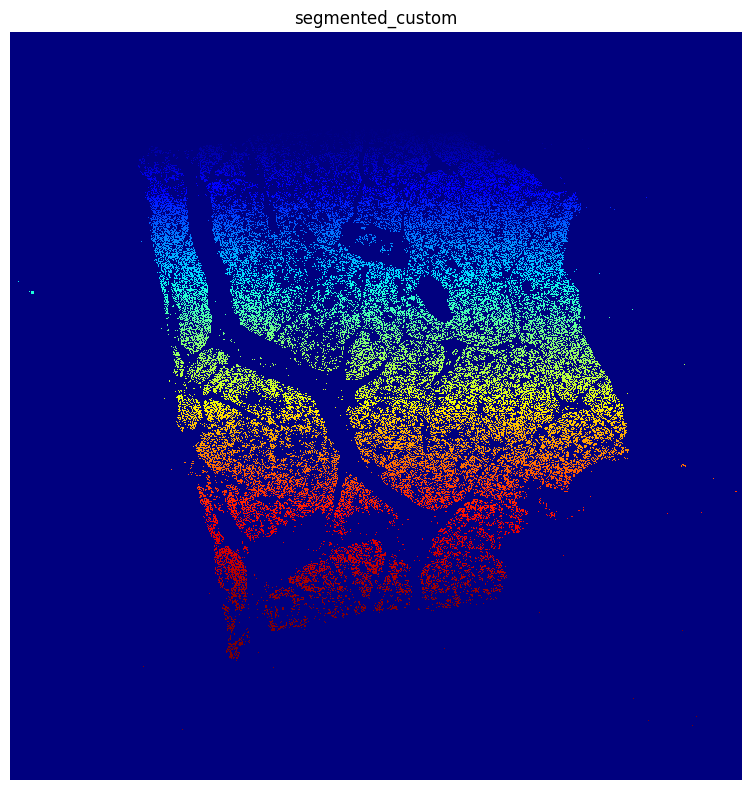

In [23]:
# Show the mask and save it in the output of seven bridges
PanCN_D4.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/norma_whole_{image_name}_mask")

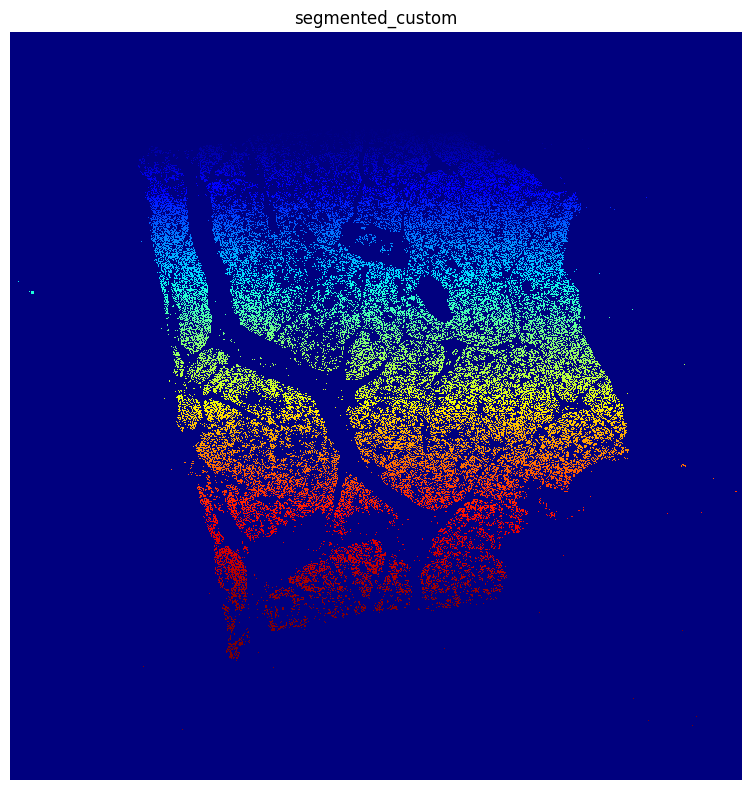

In [24]:
# Show the mask and save it in the output of the workspace
PanCN_D4.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/norma_whole_{image_name}_mask")

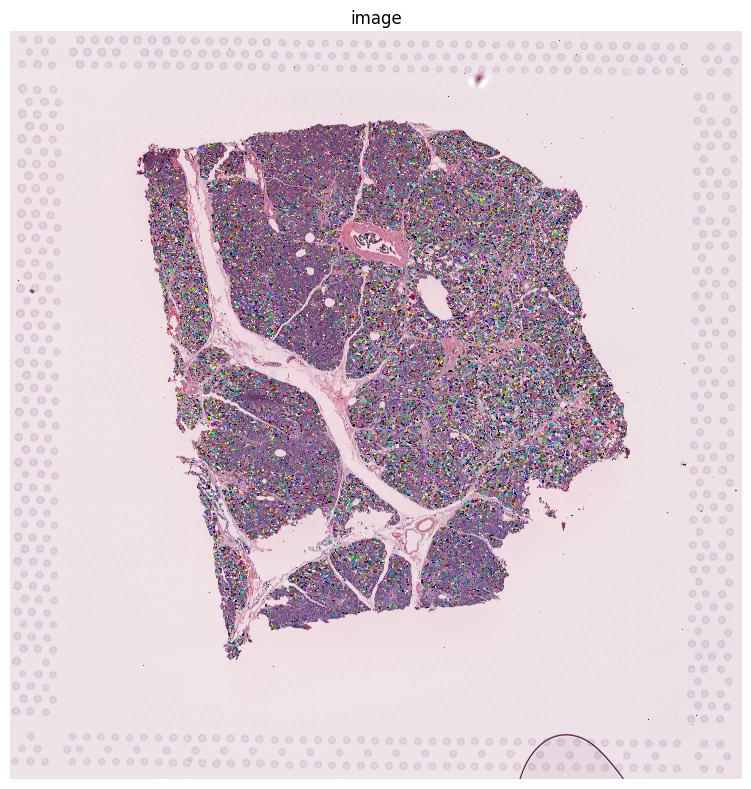

In [25]:
# Show the mask on the original input
PanCN_D4.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

### 1.2.2. PanCN_AVD_79MZ_0594_C3

In [41]:
image_name = "PanCN_AVD_79MZ_0594_C3"

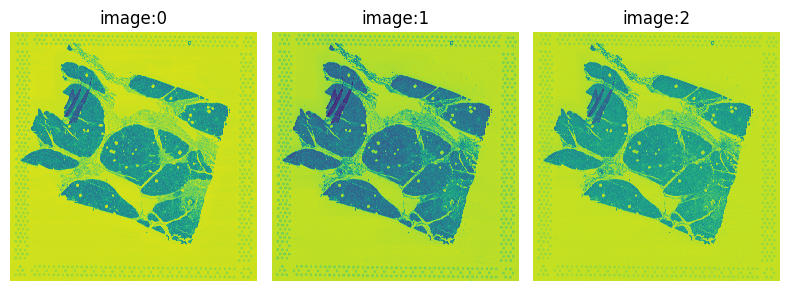

In [42]:
# Load image into an ImageContainer
PanCN_C3 = sq.im.ImageContainer("normalized_images_hne/PanCN_AVD_79MZ_0594_C3/PanCN_AVD_79MZ_0594_C3_normalized.jpg")

# Show the image in 3 channels with color inverted
PanCN_C3.show("image", channelwise=True)

In [43]:
# Run segmentation with CellPose method
sq.im.segment(img=PanCN_C3, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [44]:
PanCN_C3.save(f"{save_imCont}/norm_PanCN_C3_imCont_chunk_10000")

ImageContainer[shape=(17215, 17068), layers=['image', 'segmented_custom']]
Number of segments in crop: 33532


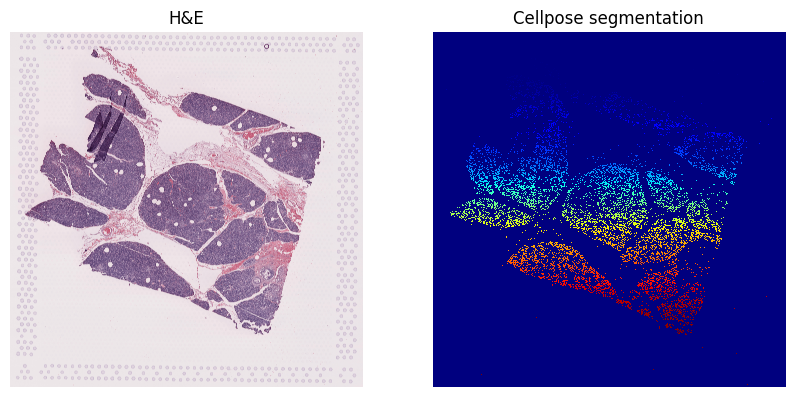

In [29]:
plot_results_segmentation(PanCN_C3)

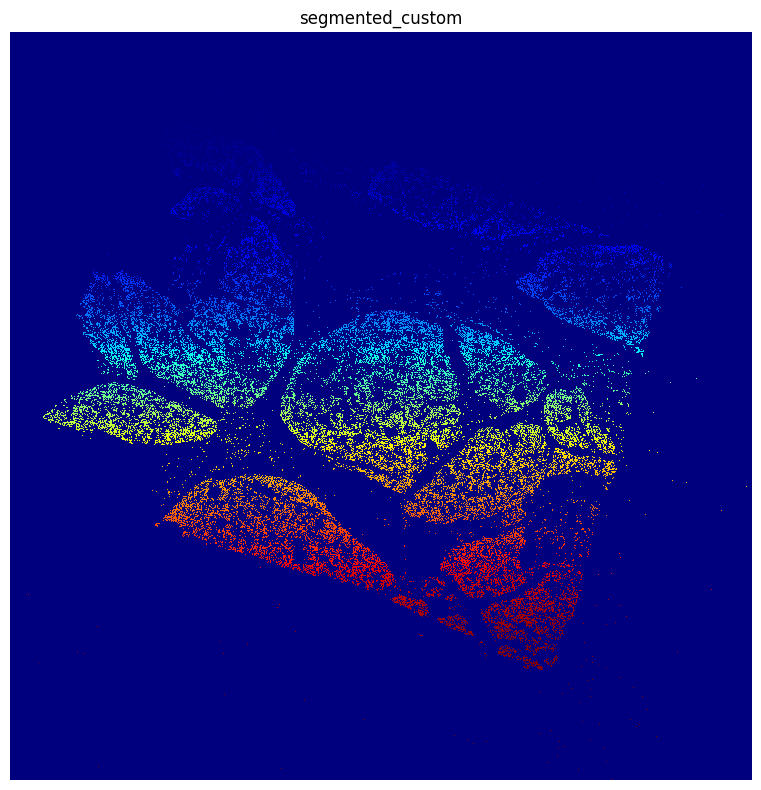

In [30]:
# Show the mask and save it in the output of seven bridges
PanCN_C3.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/norma_whole_{image_name}_mask")

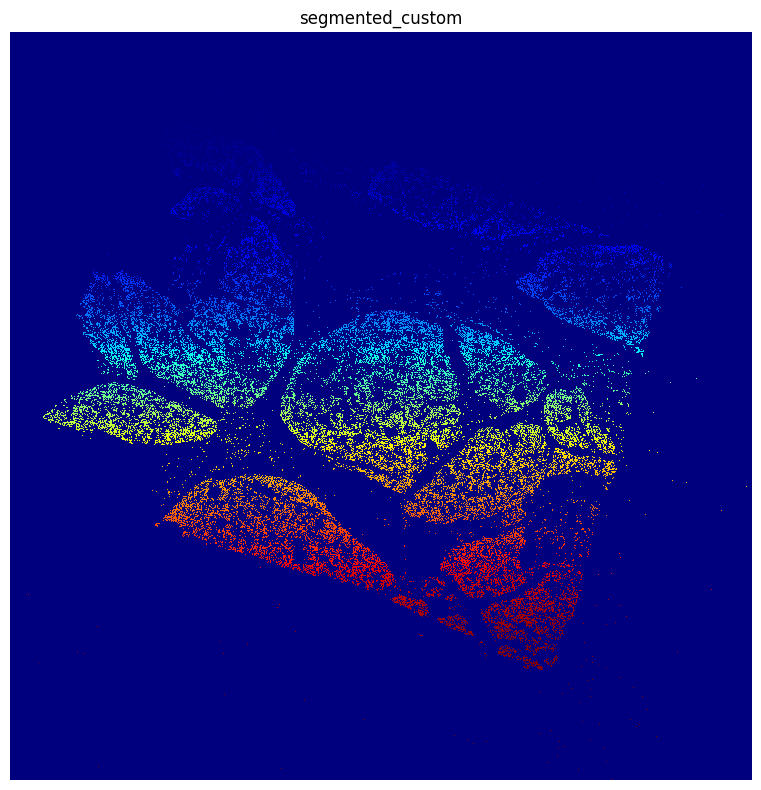

In [31]:
# Show the mask and save it in the output of the workspace
PanCN_C3.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/norma_whole_{image_name}_mask")

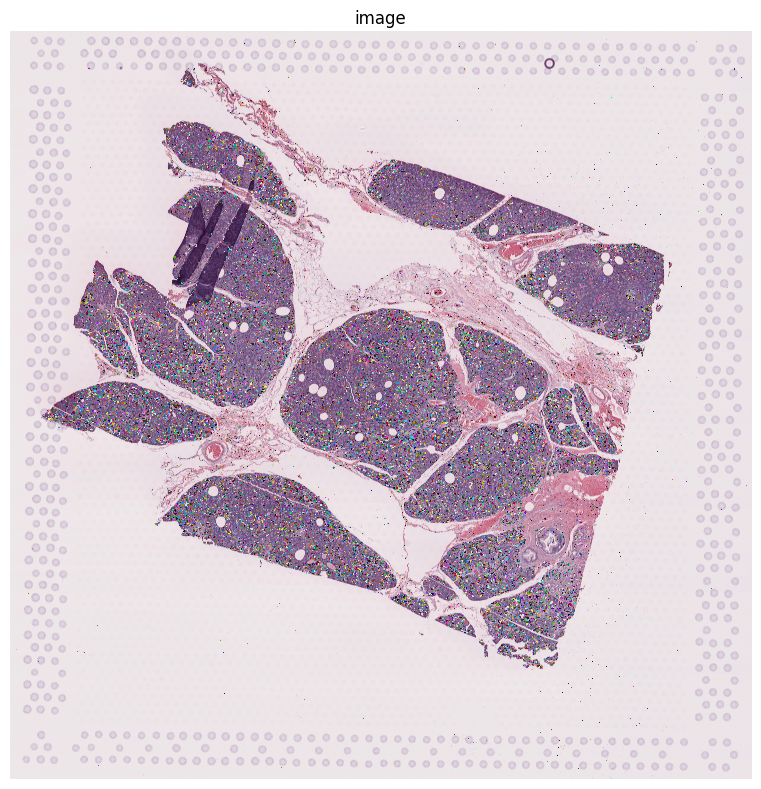

In [32]:
# Show the mask on the original input
PanCN_C3.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

# 2. Non-normalized images

## 2.1. PDAC

### 2.1.1. PDAC_ILS50185PT2_B2

In [45]:
image_name = "PDAC_ILS50185PT2_B2"

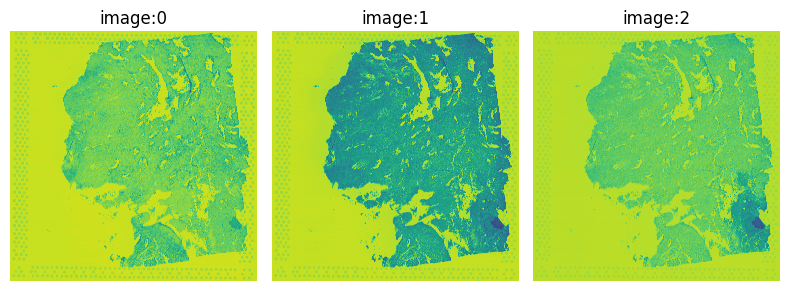

In [46]:
# Load image into an ImageContainer
PDAC_B2_non_norm = sq.im.ImageContainer("./input_images/PDAC_ILS50185PT2_B2.jpg")

# Show the image in 3 channels with color inverted
PDAC_B2_non_norm.show("image", channelwise=True)

In [47]:
# Run segmentation with CellPose method
sq.im.segment(img=PDAC_B2_non_norm, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [48]:
PDAC_B2_non_norm.save(f"{save_imCont}/non_norm_PDAC_B2_imCont_chunk_10000")

ImageContainer[shape=(17107, 16907), layers=['image', 'segmented_custom']]
Number of segments in crop: 55243


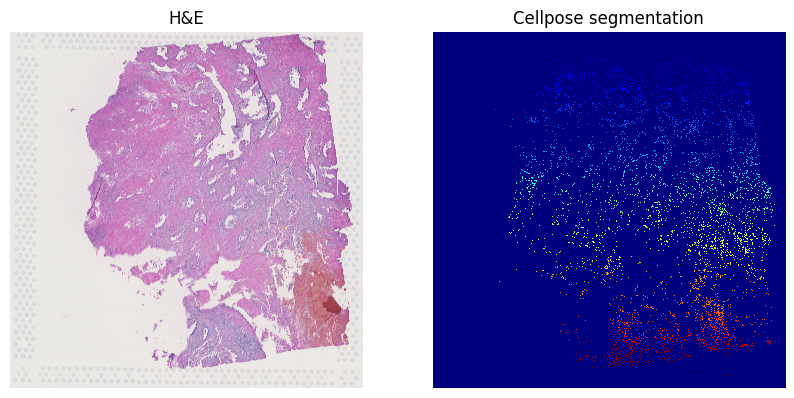

In [36]:
plot_results_segmentation(PDAC_B2_non_norm)

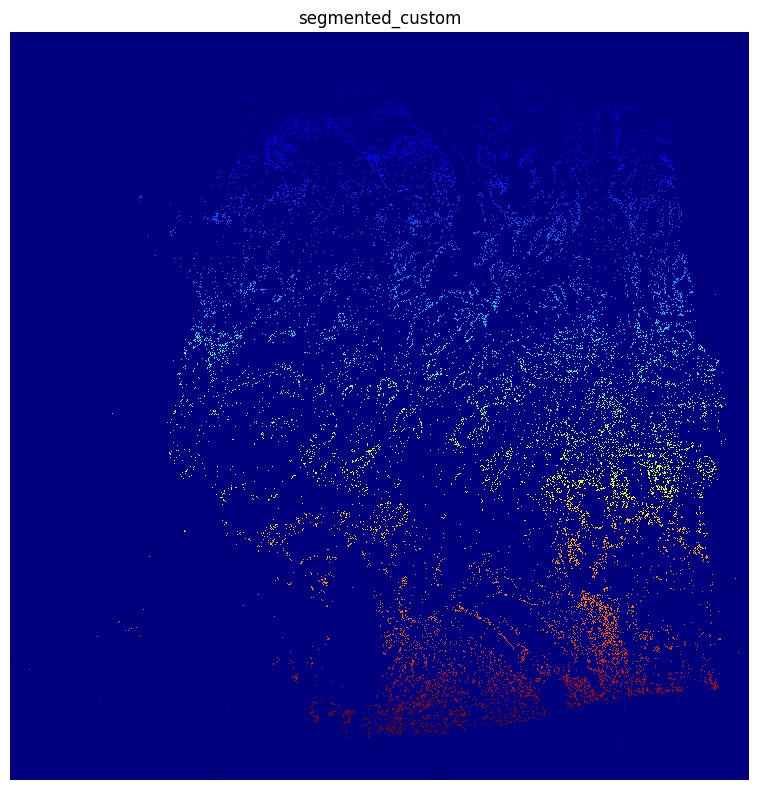

In [37]:
# Show the mask and save it in the output of seven bridges
PDAC_B2_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/non_norma_whole_{image_name}_mask")

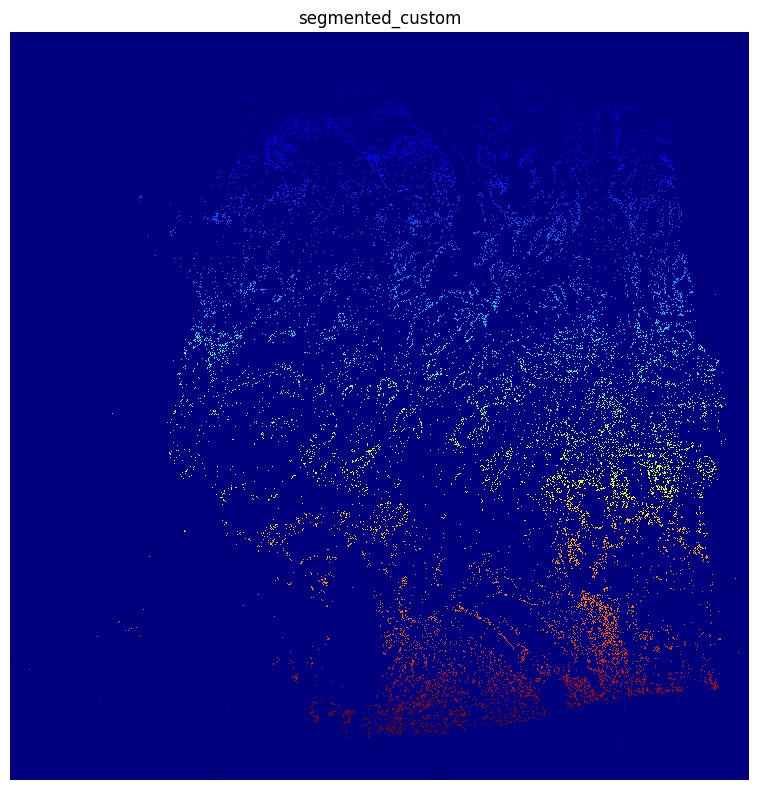

In [38]:
# Show the mask and save it in the output of the workspace
PDAC_B2_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/non_norma_whole_{image_name}_mask")

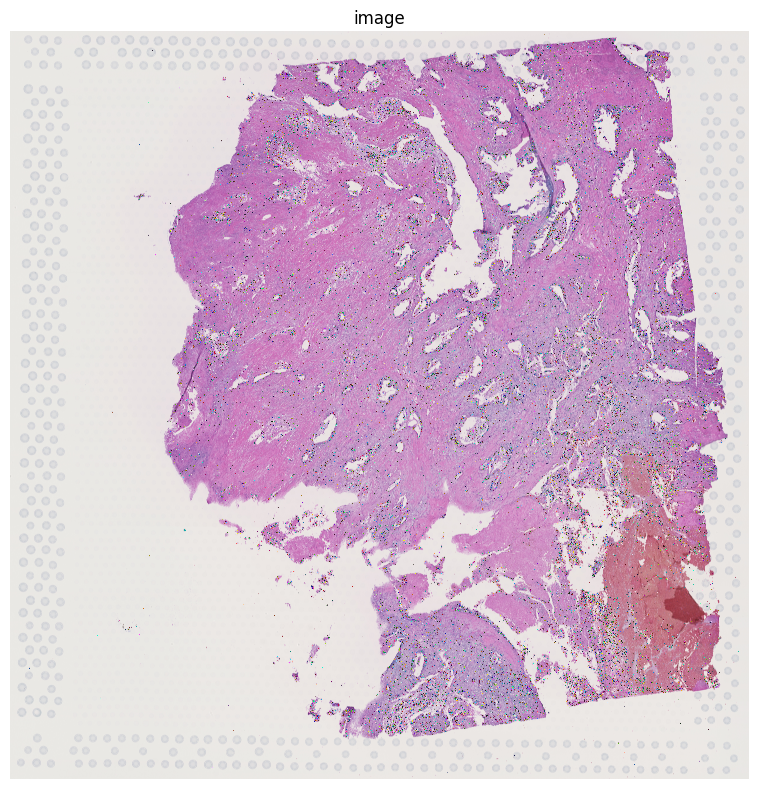

In [39]:
# Show the mask on the original input
PDAC_B2_non_norm.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

### 2.1.2. PDAC_12747476B_A1

In [49]:
image_name = "PDAC_12747476B_A1"

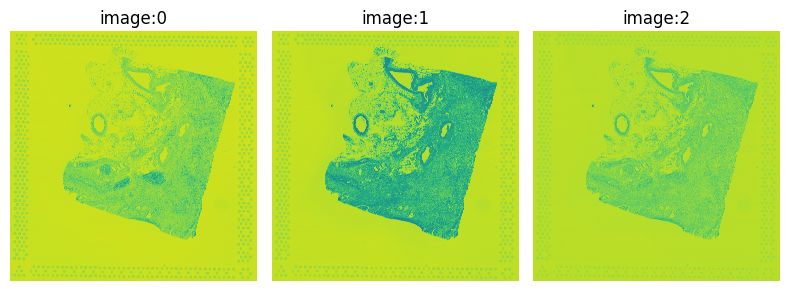

In [50]:
# Load image into an ImageContainer
PDAC_A1_non_norm = sq.im.ImageContainer("./input_images/PDAC_12747476B_A1.jpg")

# Show the image in 3 channels with color inverted
PDAC_A1_non_norm.show("image", channelwise=True)

In [51]:
# Run segmentation with CellPose method
sq.im.segment(img=PDAC_A1_non_norm, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [52]:
PDAC_A1_non_norm.save(f"{save_imCont}/non_norm_PDAC_A1_imCont_chunk_10000")

ImageContainer[shape=(17242, 17043), layers=['image', 'segmented_custom']]
Number of segments in crop: 55292


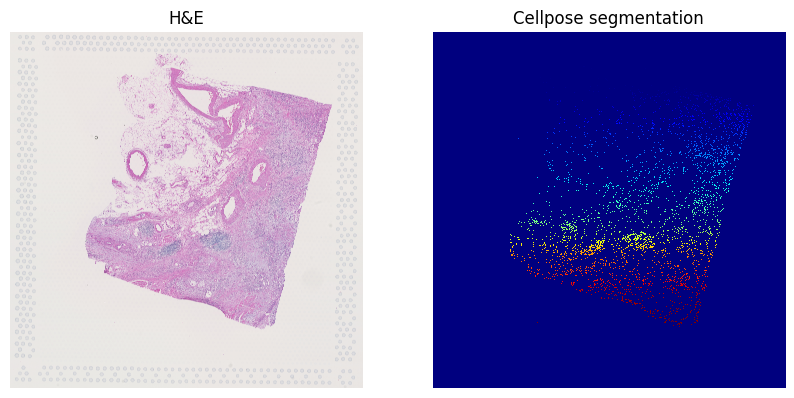

In [43]:
plot_results_segmentation(PDAC_A1_non_norm)

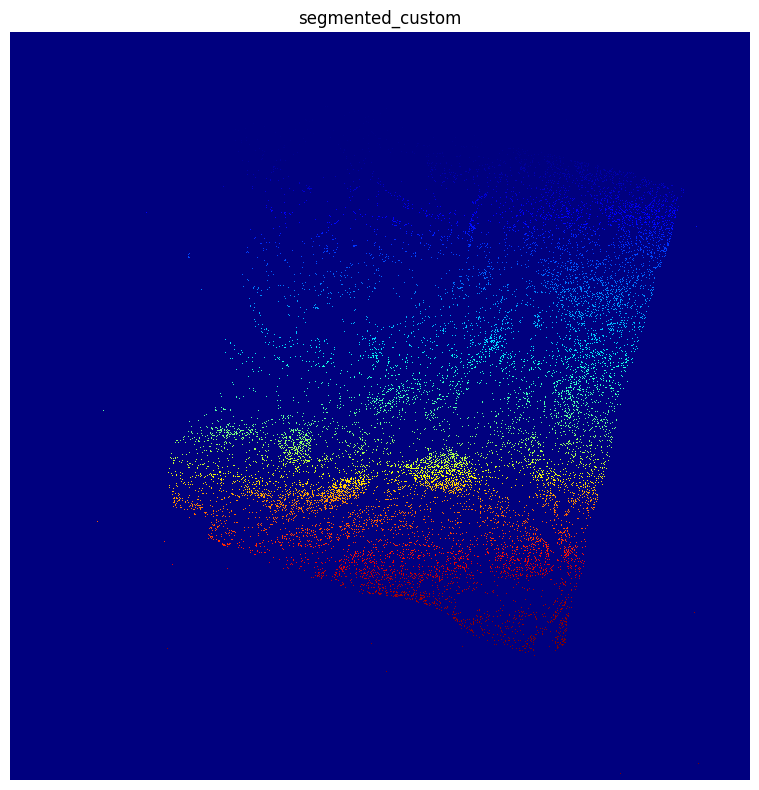

In [44]:
# Show the mask and save it in the output of seven bridges
PDAC_A1_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/non_norma_whole_{image_name}_mask")

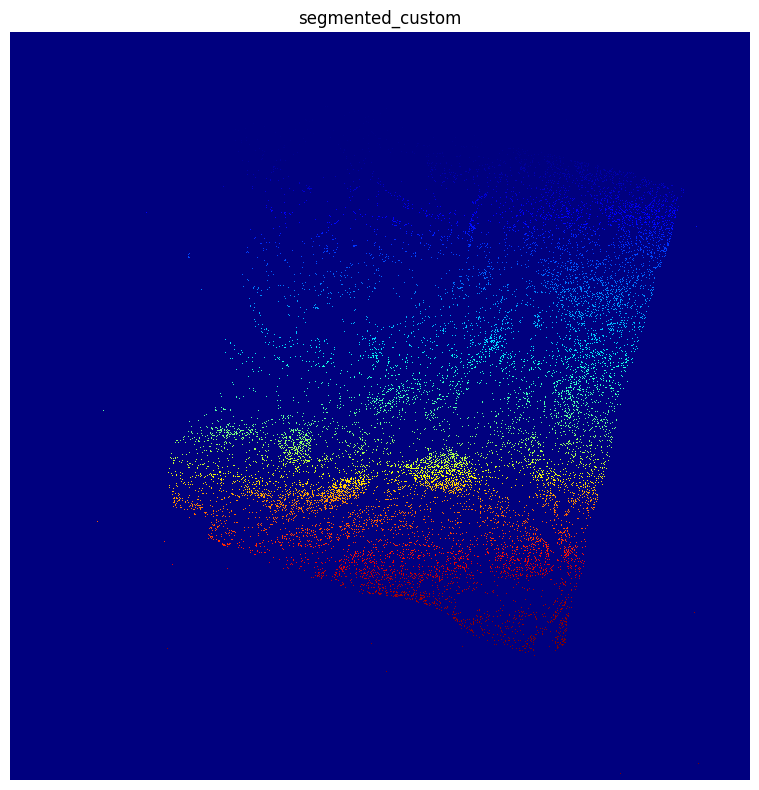

In [45]:
# Show the mask and save it in the output of the workspace
PDAC_A1_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/non_norma_whole_{image_name}_mask")

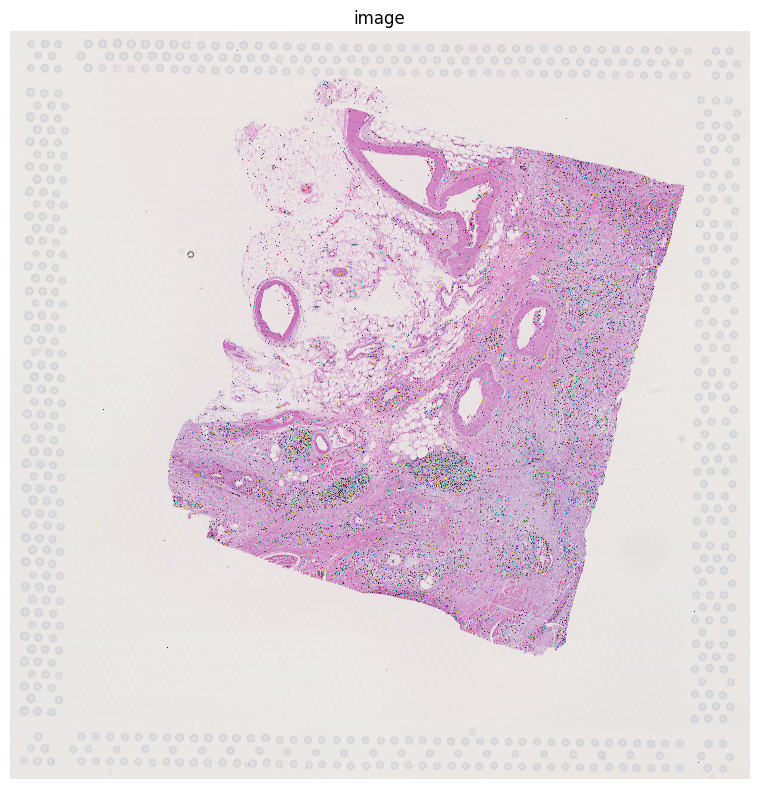

In [46]:
# Show the mask on the original input
PDAC_A1_non_norm.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

## 2.2 PanCN

### 2.2.1. PanCN_AVD_61VQ_0158

In [53]:
image_name = "PanCN_AVD_61VQ_0158_D4"

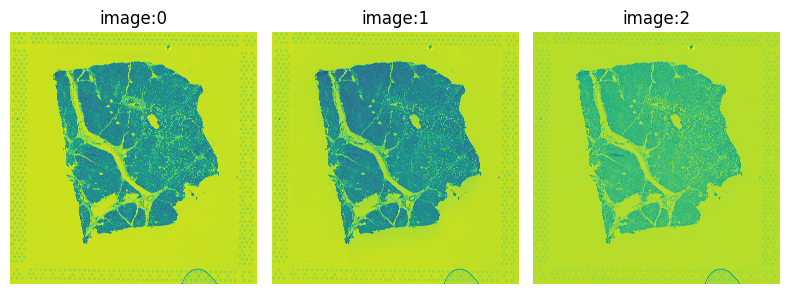

In [54]:
# Load image into an ImageContainer
PanCN_D4_non_norm = sq.im.ImageContainer("./input_images/PanCN_AVD_61VQ_0158_D4.jpg")

# Show the image in 3 channels with color inverted
PanCN_D4_non_norm.show("image", channelwise=True)

In [55]:
# Run segmentation with CellPose method
sq.im.segment(img=PanCN_D4_non_norm, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [56]:
PanCN_D4_non_norm.save(f"{save_imCont}/non_norm_PanCN_D4_imCont_chunk_10000")

ImageContainer[shape=(17137, 16768), layers=['image', 'segmented_custom']]
Number of segments in crop: 33378


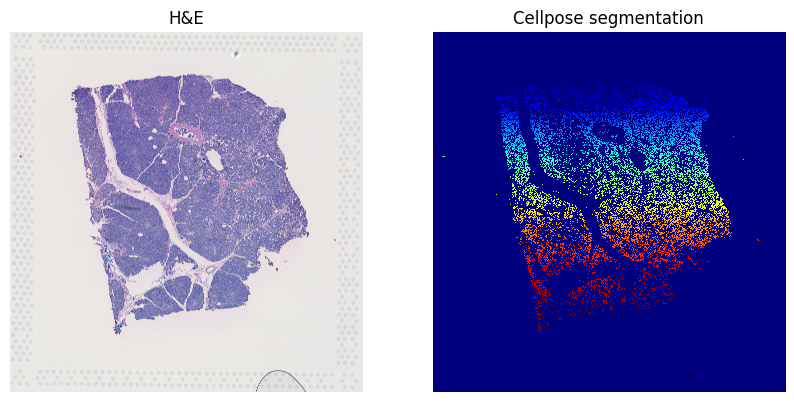

In [10]:
plot_results_segmentation(PanCN_D4_non_norm)

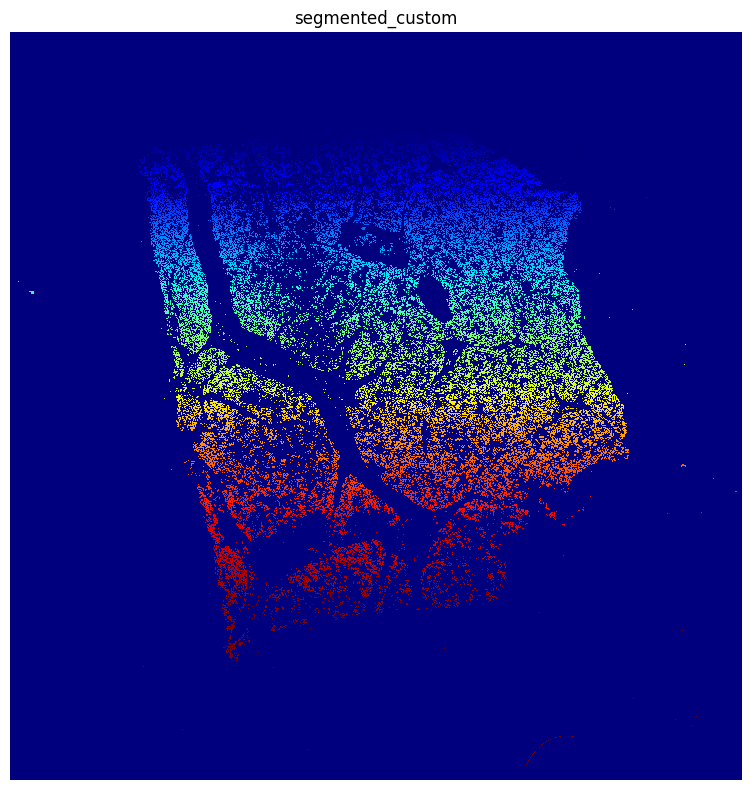

In [11]:
# Show the mask and save it in the output of seven bridges
PanCN_D4_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/non_norma_whole_{image_name}_mask")

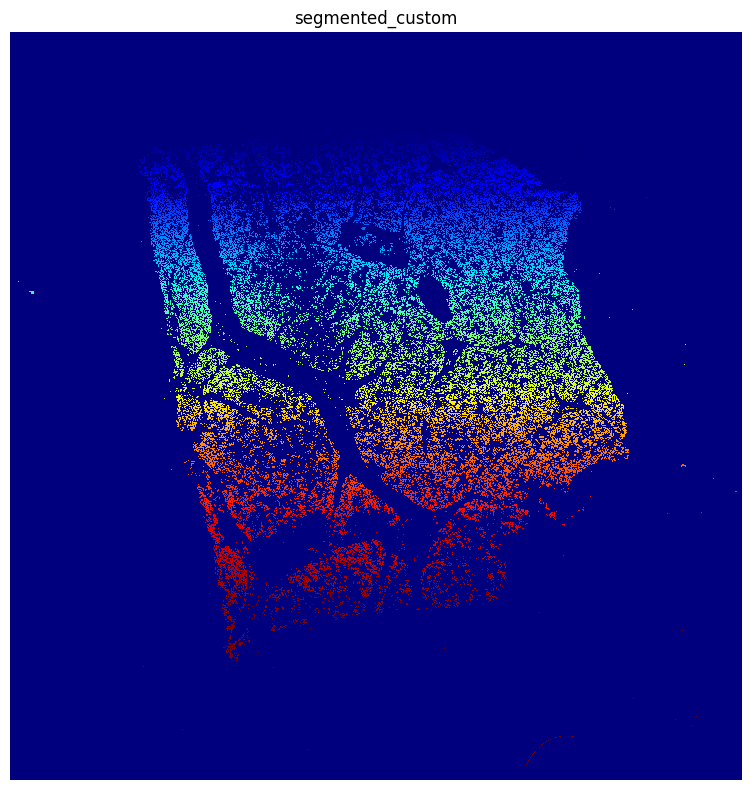

In [12]:
# Show the mask and save it in the output of the workspace
PanCN_D4_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/non_norma_whole_{image_name}_mask")

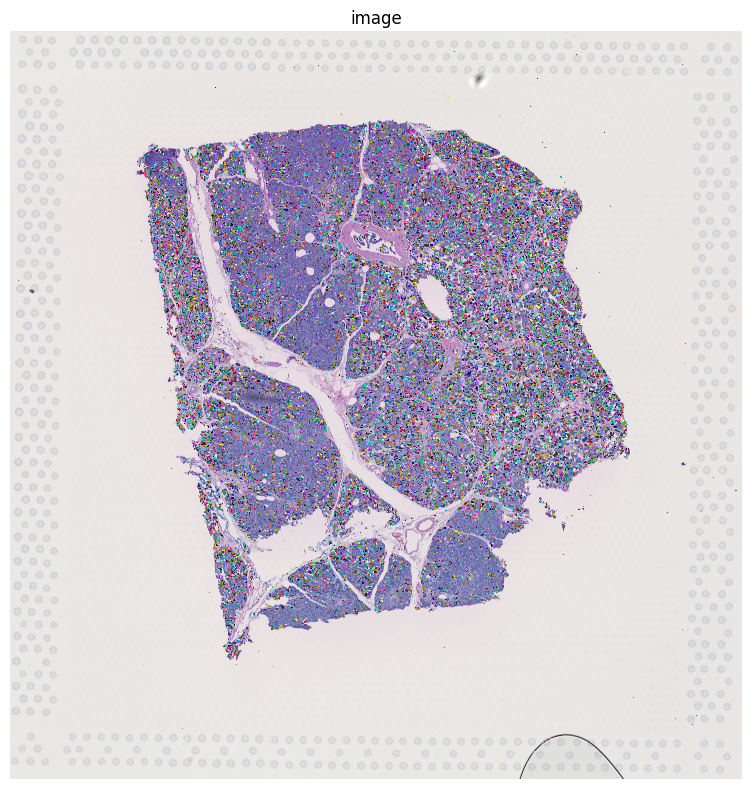

In [13]:
# Show the mask on the original input
PanCN_D4_non_norm.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)

### 2.2.2. PanCN_AVD_79MZ_0594_C3

In [57]:
image_name = "PanCN_AVD_79MZ_0594_C3"

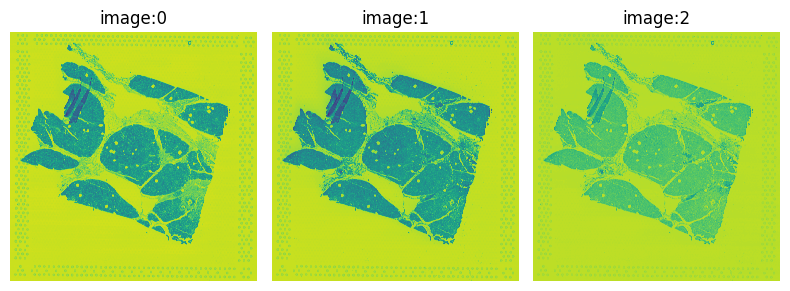

In [58]:
# Load image into an ImageContainer
PanCN_C3_non_norm = sq.im.ImageContainer("./input_images/PanCN_AVD_79MZ_0594_C3.jpg")

# Show the image in 3 channels with color inverted
PanCN_C3_non_norm.show("image", channelwise=True)

In [59]:
# Run segmentation with CellPose method
sq.im.segment(img=PanCN_C3_non_norm, layer="image", channel=None, method=cellpose_he, channel_cellpose=0, flow_threshold=0.8, chunks = 10000)

In [60]:
PanCN_C3_non_norm.save(f"{save_imCont}/non_norm_PanCN_C3_imCont_chunk_10000")

ImageContainer[shape=(17215, 17068), layers=['image', 'segmented_custom']]
Number of segments in crop: 42550


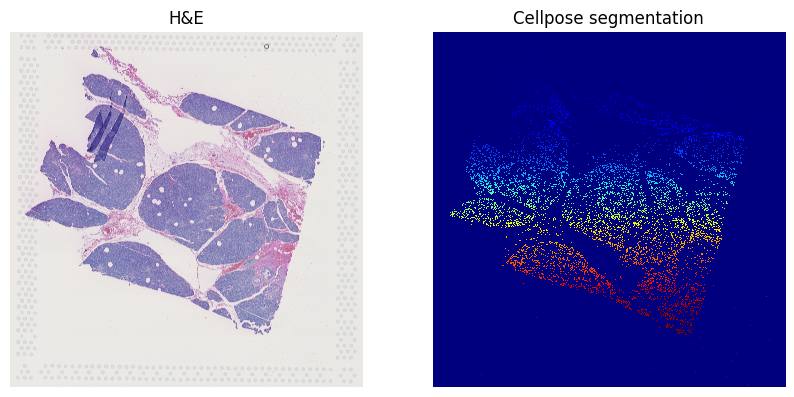

In [57]:
plot_results_segmentation(PanCN_C3_non_norm)

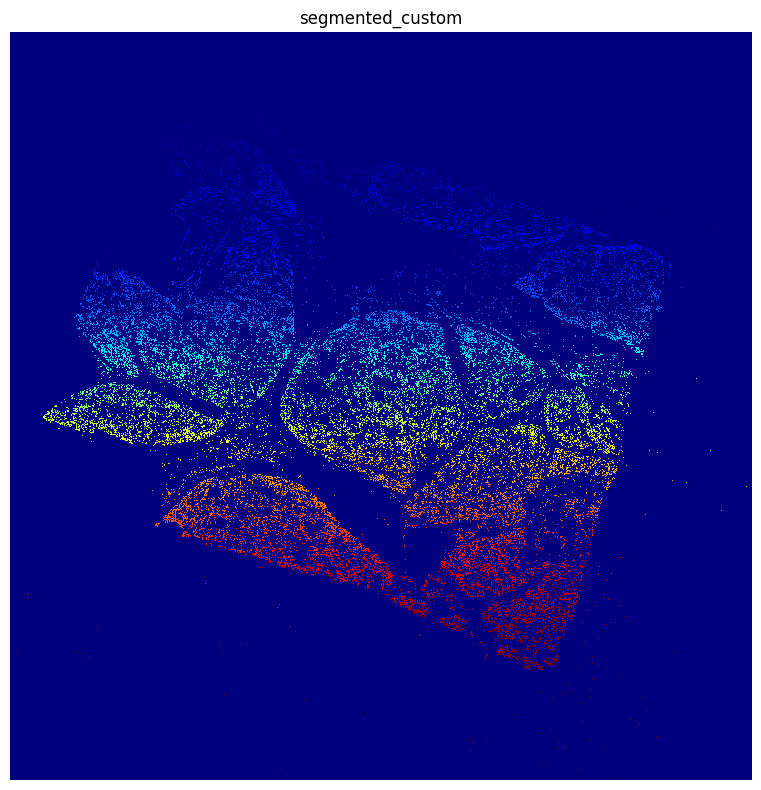

In [58]:
# Show the mask and save it in the output of seven bridges
PanCN_C3_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{output_path}/non_norma_whole_{image_name}_mask")

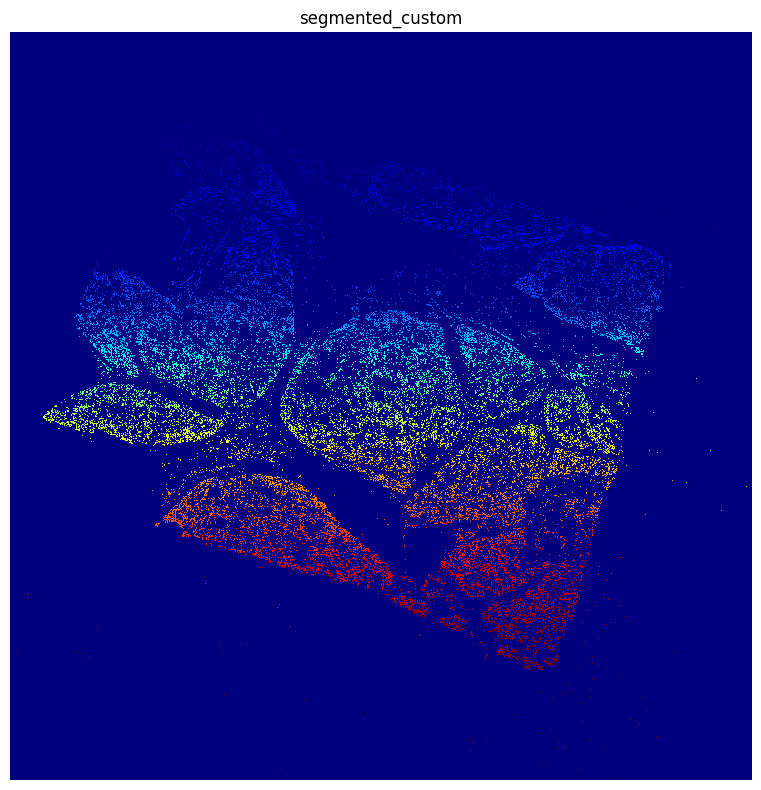

In [59]:
# Show the mask and save it in the output of the workspace
PanCN_C3_non_norm.show("segmented_custom", cmap="jet", interpolation="None", save= f"{path}/non_norma_whole_{image_name}_mask")

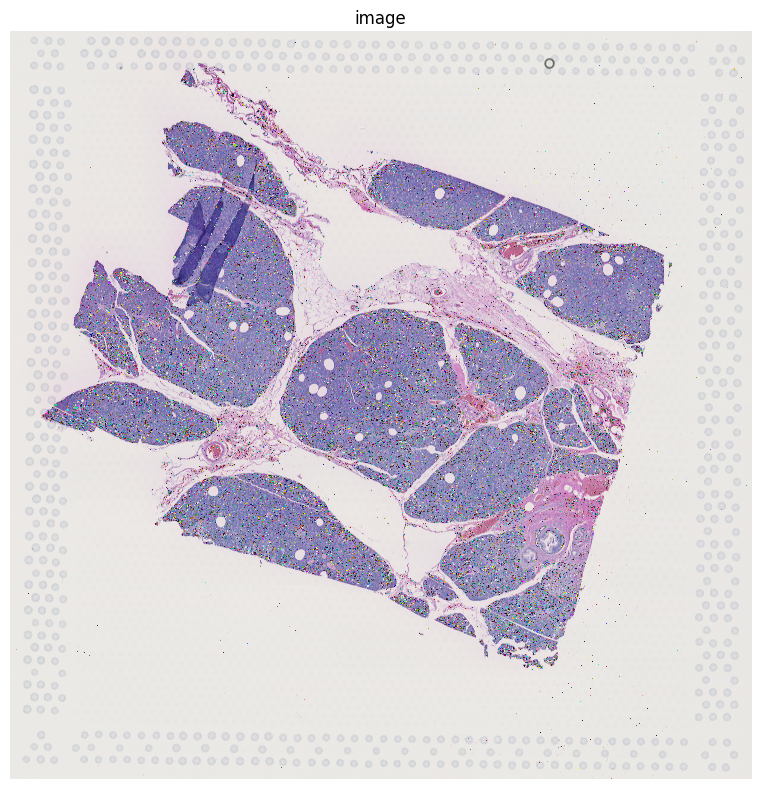

In [60]:
# Show the mask on the original input
PanCN_C3_non_norm.show("image", segmentation_layer="segmented_custom", segmentation_alpha=0.9)